# Alphalens: predictive vs. non-predictive factor

This is a very simply notebook in which we use Alphalens to analyse a predictive and a non-predictive factor. The goal is to have exemplifying output for both scenarios to make clear what to expect from Alphalens in the case of a predictive and a non-preditive factor. 

In [1]:
%pylab inline --no-import-all
import alphalens
import pandas as pd
import numpy as np
import datetime

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import warnings
warnings.filterwarnings('ignore')

Below is a simple mapping of tickers to sectors for a universe of 500 large cap stocks.

In [3]:
sector_names = {
    0 : "information_technology",
    1 : "financials",
    2 : "health_care",
    3 : "industrials",
    4 : "utilities", 
    5 : "real_estate", 
    6 : "materials", 
    7 : "telecommunication_services", 
    8 : "consumer_staples", 
    9 : "consumer_discretionary", 
    10 : "energy" 
}

ticker_sector = {
    "ACN" : 0, "ATVI" : 0, "ADBE" : 0, "AMD" : 0, "AKAM" : 0, "ADS" : 0, "GOOGL" : 0, "GOOG" : 0, 
    "APH" : 0, "ADI" : 0, "ANSS" : 0, "AAPL" : 0, "AMAT" : 0, "ADSK" : 0, "ADP" : 0, "AVGO" : 0,
    "AMG" : 1, "AFL" : 1, "ALL" : 1, "AXP" : 1, "AIG" : 1, "AMP" : 1, "AON" : 1, "AJG" : 1, "AIZ" : 1, "BAC" : 1,
    "BK" : 1, "BBT" : 1, "BRK.B" : 1, "BLK" : 1, "HRB" : 1, "BHF" : 1, "COF" : 1, "CBOE" : 1, "SCHW" : 1, "CB" : 1,
    "ABT" : 2, "ABBV" : 2, "AET" : 2, "A" : 2, "ALXN" : 2, "ALGN" : 2, "AGN" : 2, "ABC" : 2, "AMGN" : 2, "ANTM" : 2,
    "BCR" : 2, "BAX" : 2, "BDX" : 2, "BIIB" : 2, "BSX" : 2, "BMY" : 2, "CAH" : 2, "CELG" : 2, "CNC" : 2, "CERN" : 2,
    "MMM" : 3, "AYI" : 3, "ALK" : 3, "ALLE" : 3, "AAL" : 3, "AME" : 3, "AOS" : 3, "ARNC" : 3, "BA" : 3, "CHRW" : 3,
    "CAT" : 3, "CTAS" : 3, "CSX" : 3, "CMI" : 3, "DE" : 3, "DAL" : 3, "DOV" : 3, "ETN" : 3, "EMR" : 3, "EFX" : 3,
    "AES" : 4, "LNT" : 4, "AEE" : 4, "AEP" : 4, "AWK" : 4, "CNP" : 4, "CMS" : 4, "ED" : 4, "D" : 4, "DTE" : 4,
    "DUK" : 4, "EIX" : 4, "ETR" : 4, "ES" : 4, "EXC" : 4, "FE" : 4, "NEE" : 4, "NI" : 4, "NRG" : 4, "PCG" : 4,
    "ARE" : 5, "AMT" : 5, "AIV" : 5, "AVB" : 5, "BXP" : 5, "CBG" : 5, "CCI" : 5, "DLR" : 5, "DRE" : 5,
    "EQIX" : 5, "EQR" : 5, "ESS" : 5, "EXR" : 5, "FRT" : 5, "GGP" : 5, "HCP" : 5, "HST" : 5, "IRM" : 5, "KIM" : 5,
    "APD" : 6, "ALB" : 6, "AVY" : 6, "BLL" : 6, "CF" : 6, "DWDP" : 6, "EMN" : 6, "ECL" : 6, "FMC" : 6, "FCX" : 6,
    "IP" : 6, "IFF" : 6, "LYB" : 6, "MLM" : 6, "MON" : 6, "MOS" : 6, "NEM" : 6, "NUE" : 6, "PKG" : 6, "PPG" : 6,
    "T" : 7, "CTL" : 7, "VZ" : 7, 
    "MO" : 8, "ADM" : 8, "BF.B" : 8, "CPB" : 8, "CHD" : 8, "CLX" : 8, "KO" : 8, "CL" : 8, "CAG" : 8,
    "STZ" : 8, "COST" : 8, "COTY" : 8, "CVS" : 8, "DPS" : 8, "EL" : 8, "GIS" : 8, "HSY" : 8, "HRL" : 8,
    "AAP" : 9, "AMZN" : 9, "APTV" : 9, "AZO" : 9, "BBY" : 9, "BWA" : 9, "KMX" : 9, "CCL" : 9, 
    "APC" : 10, "ANDV" : 10, "APA" : 10, "BHGE" : 10, "COG" : 10, "CHK" : 10, "CVX" : 10, "XEC" : 10, "CXO" : 10,
    "COP" : 10, "DVN" : 10, "EOG" : 10, "EQT" : 10, "XOM" : 10, "HAL" : 10, "HP" : 10, "HES" : 10, "KMI" : 10
}

In [4]:
# import pandas_datareader.data as web

# tickers = list(ticker_sector.keys())
# pan = web.DataReader(tickers, "google", datetime.datetime(2017, 1, 1),  datetime.datetime(2017, 6, 1))
import yfinance as yf
start_date = datetime.datetime(2017, 1, 1)
end_date = datetime.datetime(2017, 6, 1)
tickers = list(ticker_sector.keys())
# pan = web.DataReader(tickers, "google", datetime.datetime(2017, 1, 1),  datetime.datetime(2017, 6, 1))
pan = yf.download(tickers, start=start_date, end=end_date)

[**********************99%***********************]  180 of 182 completedFailed to get ticker 'BLL' reason: ("Connection broken: InvalidChunkLength(got length b'', 0 bytes read)", InvalidChunkLength(got length b'', 0 bytes read))
[*********************100%***********************]  182 of 182 completed

29 Failed downloads:
['CBG', 'GGP', 'BCR', 'BF.B', 'DPS']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (1d 2017-01-01 00:00:00 -> 2017-06-01 00:00:00)')
['COG', 'APC', 'DWDP', 'CHK', 'ARNC', 'BHGE', 'CELG', 'ADS', 'XEC', 'DRE', 'CTL', 'ALXN', 'ABC', 'MON', 'CXO', 'BBT', 'ATVI', 'CERN', 'BRK.B', 'AGN', 'ANTM', 'BLL']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')
['HCP', 'BHF']: YFPricesMissingError('$%ticker%: possibly delisted; no price data found  (1d 2017-01-01 00:00:00 -> 2017-06-01 00:00:00) (Yahoo error = "Data doesn\'t exist for startDate = 1483246800, endDate = 1496289600")')


The pricing data passed to alphalens should contain the entry price for the assets so it must reflect the next available price after a factor value was observed at a given timestamp. Those prices must not be used in the calculation of the factor values for that time. Always double check to ensure you are not introducing lookahead bias to your study.

The pricing data must also contain the exit price for the assets, for period 1 the price at the next timestamp will be used, for period 2 the price after 2 timestamps will be used and so on.

There are no restrinctions/assumptions on the time frequencies a factor should be computed at and neither on the specific time a factor should be traded (trading at the open vs trading at the close vs intraday trading), it is only required that factor and price DataFrames are properly aligned given the rules above.

In our example, before the trading starts every day, we observe yesterday factor values. The price we pass to alphalens is the next available price after that factor observation: the daily open price that will be used as assets entry price. Also, we are not adding additional prices so the assets exit price will be the following days open prices (how many days depends on 'periods' argument). The retuns computed by Alphalens will therefore based on  assets open prices.

In [5]:
pricing = pan['Open']

We'll use a naive factor as non-predictive factor, we'll rank stocks based on recent performance: stocks that performed well in the last 10 days will have high rank and vice versa.

In [6]:
non_predictive_factor = pricing.pct_change(10)

non_predictive_factor = non_predictive_factor.stack()
non_predictive_factor.index = non_predictive_factor.index.set_names(['date', 'asset'])

To create a predictive factor we'll cheat: we will look at future prices to make sure we'll rank high stoks that will perform well and vice versa.

In [7]:
lookahead_bias_days = 5

predictive_factor = pricing.pct_change(lookahead_bias_days)
# introduce look-ahead bias and make the factor predictive
predictive_factor = predictive_factor.shift(-lookahead_bias_days)

predictive_factor = predictive_factor.stack()
predictive_factor.index = predictive_factor.index.set_names(['date', 'asset'])

# Run Alphalens on the non-predictive factor

In [8]:
non_predictive_factor_data = alphalens.utils.get_clean_factor_and_forward_returns(non_predictive_factor, 
                                                                                  pricing, 
                                                                                  quantiles=5,
                                                                                  bins=None,
                                                                                  groupby=ticker_sector,
                                                                                  groupby_labels=sector_names)

Dropped 10.8% entries from factor data: 10.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


factor_data =                                         1D        5D       10D    factor  \
date                      asset                                           
2017-01-18 00:00:00+00:00 A     -0.012944 -0.021985  0.005342  0.059656   
                          AAL    0.005063  0.010549 -0.055907  0.002538   
                          AAP    0.006936 -0.020866 -0.051962  0.013058   
                          AAPL  -0.005000  0.003500  0.058583  0.036269   
                          ABBV  -0.005019 -0.018782 -0.011172 -0.018436   
...                                   ...       ...       ...       ...   
2017-05-16 00:00:00+00:00 SCHW  -0.000492 -0.053822 -0.050135  0.022619   
                          STZ   -0.002682  0.010892 -0.009852  0.057169   
                          T     -0.012668 -0.010858 -0.000776 -0.011753   
                          VZ    -0.000662  0.003088  0.024041 -0.014348   
                          XOM   -0.004222 -0.006996 -0.023643  0.009253   

         

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,-0.241692,0.008979,-0.046064,0.030014,2573,20.261438
2.0,-0.041236,0.025607,-0.008629,0.011211,2490,19.607843
3.0,-0.018046,0.039946,0.006126,0.010892,2573,20.261438
4.0,-0.001776,0.055556,0.020658,0.012346,2490,19.607843
5.0,0.008404,0.412060,0.054151,0.034594,2573,20.261438


Returns Analysis


,1D,5D,10D
Ann. alpha,0.015,0.058,0.065
beta,-0.161,-0.182,-0.119
Mean Period Wise Return Top Quantile (bps),-4.010,-1.534,-0.503
Mean Period Wise Return Bottom Quantile (bps),-2.320,-5.022,-4.901
Mean Period Wise Spread (bps),-1.691,3.514,4.412


<Figure size 640x480 with 0 Axes>

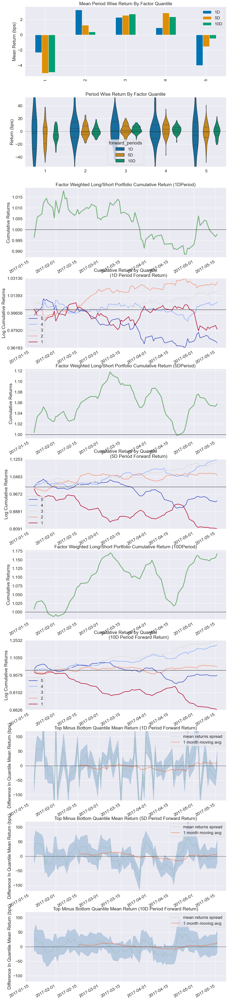

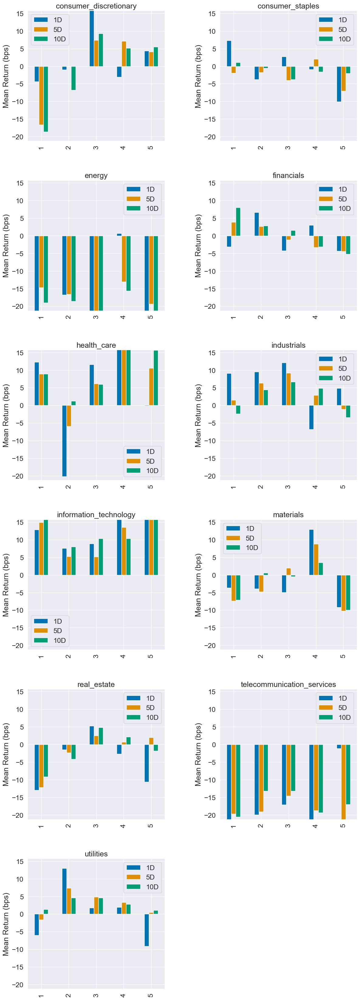

Information Analysis


,1D,5D,10D
IC Mean,-0.014,0.014,0.043
IC Std.,0.167,0.194,0.174
Risk-Adjusted IC,-0.082,0.072,0.246
t-stat(IC),-0.748,0.660,2.245
p-value(IC),0.457,0.511,0.027
IC Skew,-0.341,-0.312,-0.299
IC Kurtosis,0.700,-0.539,-1.091


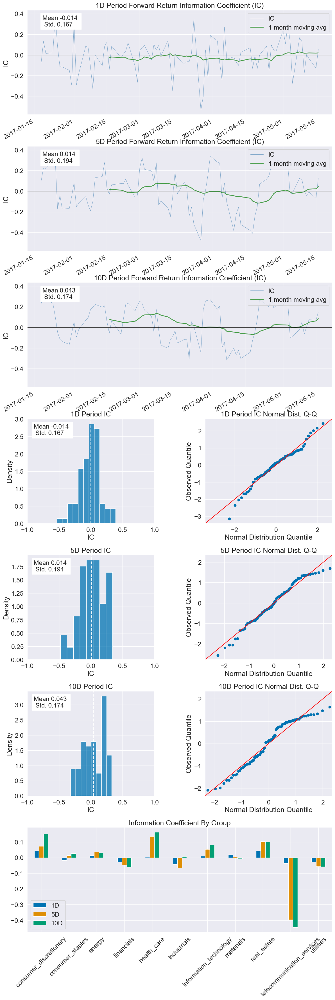

Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.228,0.487,0.718
Quantile 2 Mean Turnover,0.492,0.733,0.802
Quantile 3 Mean Turnover,0.543,0.730,0.791
Quantile 4 Mean Turnover,0.522,0.736,0.785
Quantile 5 Mean Turnover,0.255,0.569,0.792


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.861,0.468,0.044


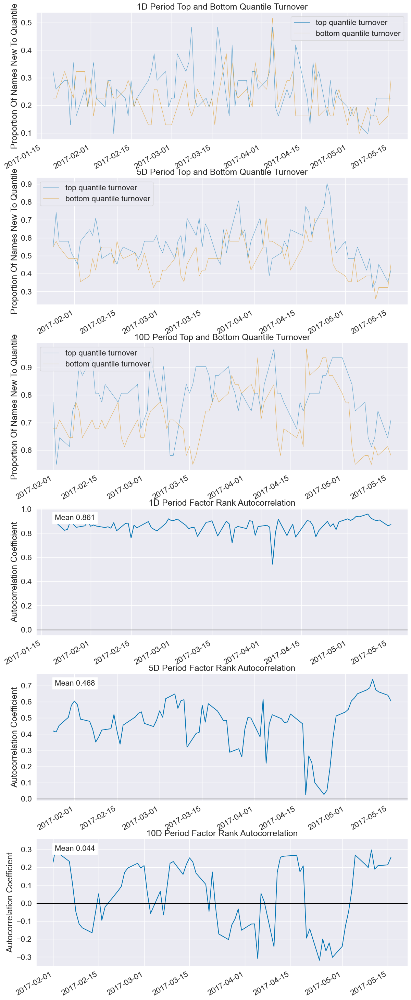

In [9]:
alphalens.tears.create_full_tear_sheet(non_predictive_factor_data, by_group=True)

# Run Alphalens on the predictive factor

In [10]:
predictive_factor_data = alphalens.utils.get_clean_factor_and_forward_returns(predictive_factor, 
                                                                              pricing, 
                                                                              quantiles=5,
                                                                              bins=None,
                                                                              groupby=ticker_sector,
                                                                              groupby_labels=sector_names)

Dropped 5.1% entries from factor data: 5.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


factor_data =                                         1D        5D       10D    factor  \
date                      asset                                           
2017-01-03 00:00:00+00:00 A      0.021772  0.052471  0.059656  0.052471   
                          AAL   -0.013748 -0.005922  0.002538 -0.005922   
                          AAP   -0.002401 -0.012179  0.013058 -0.012179   
                          AAPL   0.000432  0.025648  0.036269  0.025648   
                          ABBV  -0.004450  0.017959 -0.018436  0.017959   
...                                   ...       ...       ...       ...   
2017-05-16 00:00:00+00:00 SCHW  -0.000492 -0.053822 -0.050135 -0.053822   
                          STZ   -0.002682  0.010892 -0.009852  0.010892   
                          T     -0.012668 -0.010858 -0.000776 -0.010858   
                          VZ    -0.000662  0.003088  0.024041  0.003088   
                          XOM   -0.004222 -0.006996 -0.023643 -0.006996   

         

,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,-0.262200,0.002974,-0.032516,0.023979,2883,20.261438
2.0,-0.036666,0.012059,-0.007666,0.008806,2791,19.614871
3.0,-0.023938,0.024240,0.002678,0.008284,2882,20.254410
4.0,-0.012384,0.040420,0.012786,0.009105,2791,19.614871
5.0,-0.003060,0.325472,0.036300,0.024561,2882,20.254410


Returns Analysis


,1D,5D,10D
Ann. alpha,6.125,5.751,1.576
beta,-0.124,-0.028,0.093
Mean Period Wise Return Top Quantile (bps),68.446,67.059,32.807
Mean Period Wise Return Bottom Quantile (bps),-73.501,-70.645,-36.528
Mean Period Wise Spread (bps),141.947,137.713,69.340


<Figure size 640x480 with 0 Axes>

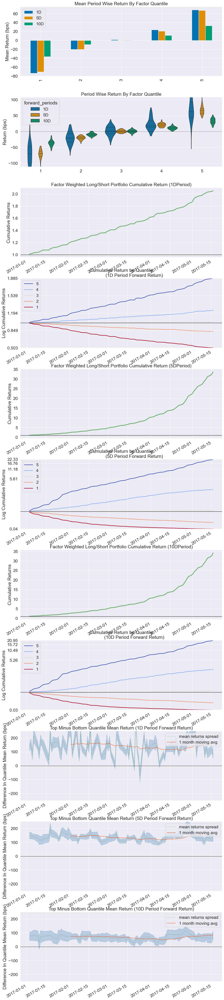

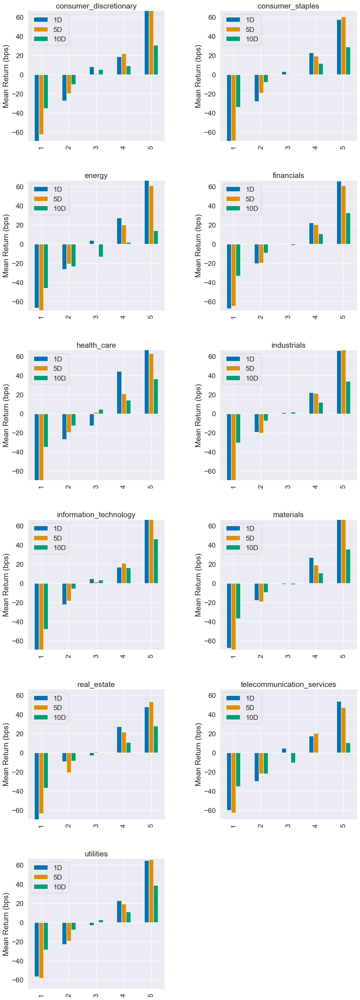

Information Analysis


,1D,5D,10D
IC Mean,0.407,1.000000e+00,0.668
IC Std.,0.154,0.000000e+00,0.108
Risk-Adjusted IC,2.639,8.639402e+16,6.199
t-stat(IC),25.450,8.331538e+17,59.784
p-value(IC),0.000,0.000000e+00,0.000
IC Skew,-1.126,NaN,-1.126
IC Kurtosis,2.970,NaN,1.477


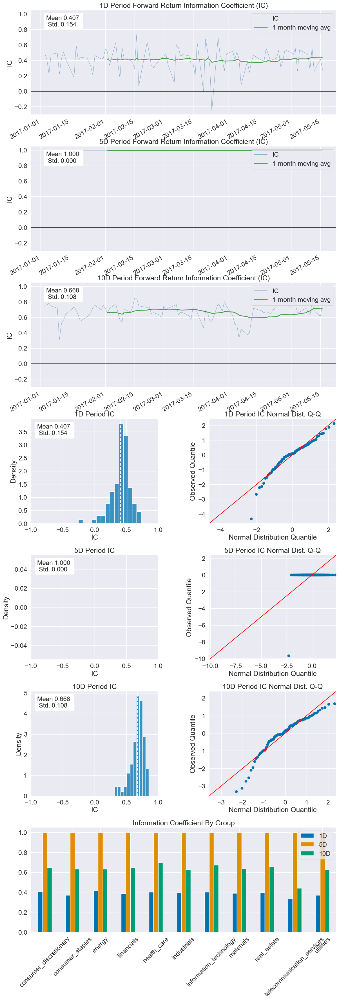

Turnover Analysis


,1D,5D,10D
Quantile 1 Mean Turnover,0.343,0.750,0.737
Quantile 2 Mean Turnover,0.612,0.816,0.806
Quantile 3 Mean Turnover,0.650,0.771,0.787
Quantile 4 Mean Turnover,0.618,0.806,0.794
Quantile 5 Mean Turnover,0.352,0.788,0.794


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.744,-0.022,0.028


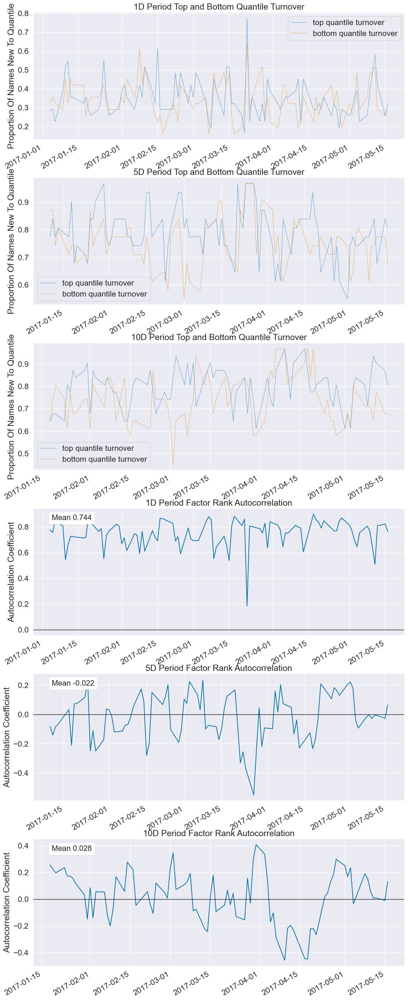

In [11]:
alphalens.tears.create_full_tear_sheet(predictive_factor_data, by_group=True)

# Run Event Style Returns Analysis

## Non-predictive factor

series =  Ticker         ADP         AYI        EIX        CAT        AXP        ETN  \
-5      102.250000  206.850006  71.080002  92.980003  76.519997  67.209999   
-4      102.269997  208.259995  71.070000  94.470001  76.669998  66.949997   
-3      102.980003  209.979996  72.059998  94.370003  76.830002  68.389999   
-2      103.769997  215.539993  72.239998  94.070000  76.930000  68.360001   
-1      103.320000  214.220001  72.389999  94.239998  77.400002  68.339996   
0       103.489998  210.130005  72.610001  92.790001  77.110001  67.690002   
1       102.790001  206.080002  72.099998  93.580002  77.610001  68.129997   
2       103.000000  208.800003  71.870003  94.010002  75.989998  68.019997   
3       102.809998  207.179993  72.080002  94.599998  75.919998  67.919998   
4       102.250000  208.000000  71.720001  95.019997  76.330002  68.050003   
5       103.459999  211.000000  71.750000  97.820000  78.000000  69.639999   
6       102.410004  210.940002  71.800003  98.449997  

<Figure size 640x480 with 0 Axes>

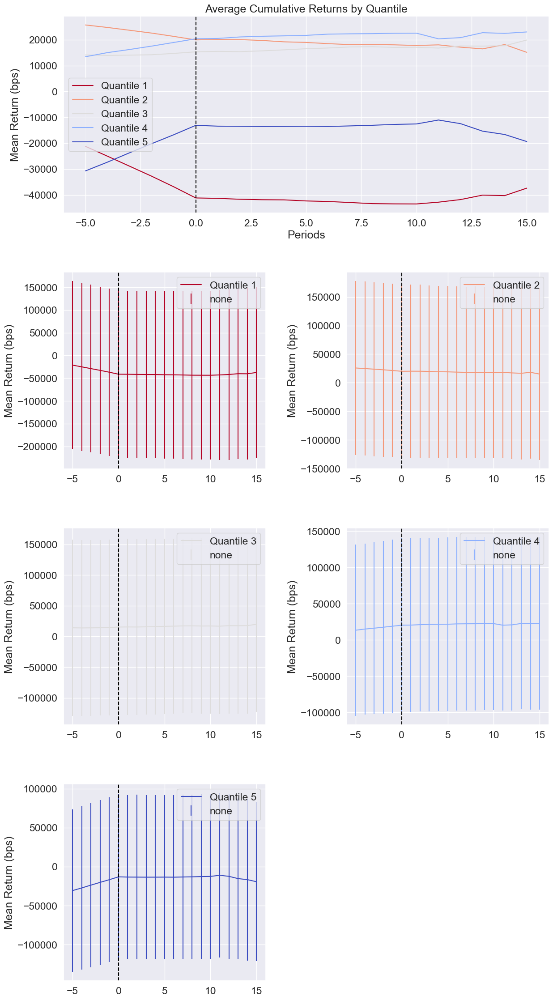

In [12]:
alphalens.tears.create_event_returns_tear_sheet(non_predictive_factor_data, pricing)

## Predictive factor

series =  Ticker         ADP         AYI        EIX        CAT        AXP        ETN  \
0       102.379997  232.889999  71.760002  94.000000  74.889999  67.589996   
1       103.410004  234.250000  71.940002  94.459999  75.260002  68.599998   
2       103.459999  239.860001  72.480003  93.180000  76.000000  68.059998   
3       103.230003  239.429993  71.820000  93.449997  75.400002  67.610001   
4       102.949997  208.339996  71.910004  92.930000  76.139999  68.480003   
5       102.250000  206.850006  71.080002  92.980003  76.519997  67.209999   
6       102.269997  208.259995  71.070000  94.470001  76.669998  66.949997   
7       102.980003  209.979996  72.059998  94.370003  76.830002  68.389999   
8       103.769997  215.539993  72.239998  94.070000  76.930000  68.360001   
9       103.320000  214.220001  72.389999  94.239998  77.400002  68.339996   
10      103.489998  210.130005  72.610001  92.790001  77.110001  67.690002   
11      102.790001  206.080002  72.099998  93.580002  

<Figure size 640x480 with 0 Axes>

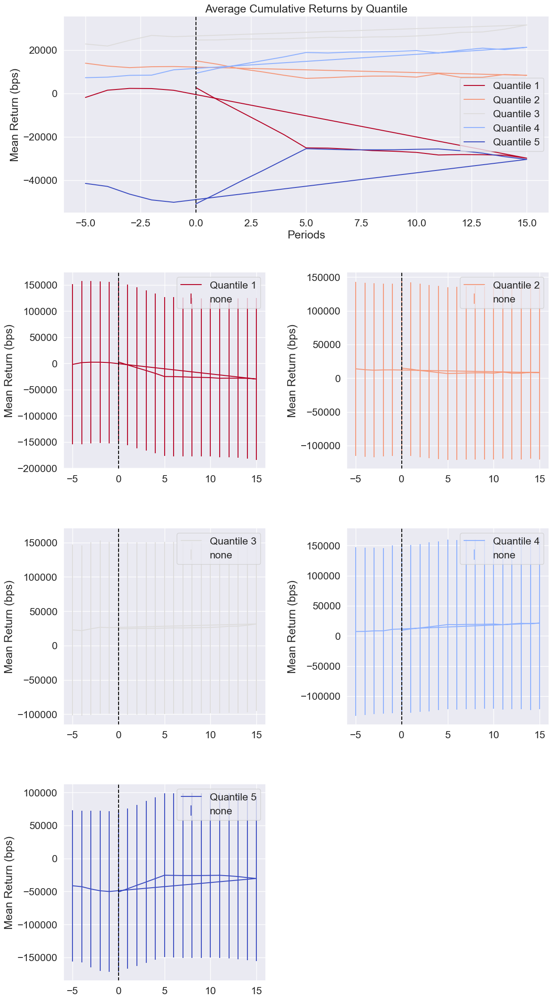

In [13]:
alphalens.tears.create_event_returns_tear_sheet(predictive_factor_data, pricing)